##### Submitted by : 
    - Shushank Shekhar(shushank.ss@gmail.com)
    - Kewal Krishna Singh(krishnaiiitecoconics@gmail.com)

## Telecom churn case study

### Problem Statement:
In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

   - For many incumbent operators, retaining high profitable customers is the number one business goal.

   - To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.    

### Business Goal:
   - Predict churn risk for customers
   - Identify important variables

### Steps:
   - **Stage 1 : Data understanding, preparation, and feature engineering**
       - Create list of variables :  ids, dates, categorical, numerical columns
       - Indentify columns with missing values, drop or impute accordingly
       - Identify high value customers according to definition
       - Derive variables like difference between last months.
       - Perform EDA:
          - Univariate
          - Bivariate
       - Check for outliers and remove if required
   - **Stage 2 : Modelling(Churn Prediction)**

       - PCA + Logistic Regression
       - Random Forest + Grid Search CV
       - Imbalance handling:
           - SMOTE
       - Modelling again after SMOTE:
           - PCA + Logistic Regression
           - Random Forest + Grid Search CV
   - **Stage 3 : Identifying important churn indicators**
       - Get important variables using Random forest
   - **Stage 4 : Recommendations**

    


## Stage 1 : Data understanding, preparation, and feature engineering 

### Importing libraries and loading the data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')


# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

pd.set_option("display.max_columns", 300)
pd.set_option("display.max_rows", 300)

In [2]:
df = pd.read_csv('telecom_churn_data.csv')
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [3]:
#taking a copy of original dataset
data_original = df.copy()

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


#### We can see, most of the columns are numeric, but we have some categorical types as well. We will inspect those.

#### Lets inspect column wise stats

In [5]:
df.describe(include='all')

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999,99398,98899,98340,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000

In [6]:
#We have different types of columns, making list of all those
ids = ['mobile_number', 'circle_id']

dates = ['last_date_of_month_6',
             'last_date_of_month_7',
             'last_date_of_month_8',
             'last_date_of_month_9',
             'date_of_last_rech_6',
             'date_of_last_rech_7',
             'date_of_last_rech_8',
             'date_of_last_rech_9',
             'date_of_last_rech_data_6',
             'date_of_last_rech_data_7',
             'date_of_last_rech_data_8',
             'date_of_last_rech_data_9'
            ]

cat_cols =  ['night_pck_user_6',
             'night_pck_user_7',
             'night_pck_user_8',
             'night_pck_user_9',
             'fb_user_6',
             'fb_user_7',
             'fb_user_8',
             'fb_user_9'
            ]

# everything else will be a numerical column, so we will assign as such
num_cols = [column for column in df.columns if column not in ids + dates + cat_cols]

In [7]:
#check total number of columns:
print(len(num_cols + ids + dates + cat_cols)==df.shape[1])

True


#### So, we have separate lists of all types of columns

### Now, lets see if there are null values or not.

In [8]:
#Missing percentage in each column
100*df.isnull().sum().sort_values(ascending=False)/df.shape[0]

arpu_3g_6                   74.846748
night_pck_user_6            74.846748
total_rech_data_6           74.846748
arpu_2g_6                   74.846748
max_rech_data_6             74.846748
fb_user_6                   74.846748
av_rech_amt_data_6          74.846748
date_of_last_rech_data_6    74.846748
count_rech_2g_6             74.846748
count_rech_3g_6             74.846748
date_of_last_rech_data_7    74.428744
total_rech_data_7           74.428744
fb_user_7                   74.428744
max_rech_data_7             74.428744
night_pck_user_7            74.428744
count_rech_2g_7             74.428744
av_rech_amt_data_7          74.428744
arpu_2g_7                   74.428744
count_rech_3g_7             74.428744
arpu_3g_7                   74.428744
total_rech_data_9           74.077741
count_rech_3g_9             74.077741
fb_user_9                   74.077741
max_rech_data_9             74.077741
arpu_3g_9                   74.077741
date_of_last_rech_data_9    74.077741
night_pck_us

#### We have some columns with less than 10% nulls and others with more than 70% nulls, we will decide, which ones to drop and which ones to keep and handle nulls.

In [9]:
# We do noot need date and id columns for modelling, removing those:
df.drop(dates+ids,axis=1,inplace=True)

#### Now there are several null values, we will handle them in different ways:
   - We are **dropping** columns with more than **70% null** values.
   - Among others, we have done two options:
       - **Numerical nulls of recharge amount** will be filled with 0
       - **Numerical nulls** of other types will be filled with their respectime **medians**
       - **Categorical nulls** will be filled with "None"

In [10]:
# list of numerical columns where we will impute missing values with 0
zero_impute = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9',
        'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9',
        'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9'
       ]
df[zero_impute] = df[zero_impute].fillna(0)

In [11]:
# replace missing values with 'None' in categorical columns
df[cat_cols] = df[cat_cols].fillna("None")

In [12]:
#Dropping columns with more than 70% null values
threshold = 70
null_percentage = df.isnull().sum()/df.shape[0]*100
col_to_drop = null_percentage[null_percentage>=threshold].keys()
df.drop(col_to_drop, axis=1,inplace=True)

In [13]:
df = df.fillna(df.median())

In [14]:
df.isnull().sum()

loc_og_t2o_mou        0
std_og_t2o_mou        0
loc_ic_t2o_mou        0
arpu_6                0
arpu_7                0
arpu_8                0
arpu_9                0
onnet_mou_6           0
onnet_mou_7           0
onnet_mou_8           0
onnet_mou_9           0
offnet_mou_6          0
offnet_mou_7          0
offnet_mou_8          0
offnet_mou_9          0
roam_ic_mou_6         0
roam_ic_mou_7         0
roam_ic_mou_8         0
roam_ic_mou_9         0
roam_og_mou_6         0
roam_og_mou_7         0
roam_og_mou_8         0
roam_og_mou_9         0
loc_og_t2t_mou_6      0
loc_og_t2t_mou_7      0
loc_og_t2t_mou_8      0
loc_og_t2t_mou_9      0
loc_og_t2m_mou_6      0
loc_og_t2m_mou_7      0
loc_og_t2m_mou_8      0
loc_og_t2m_mou_9      0
loc_og_t2f_mou_6      0
loc_og_t2f_mou_7      0
loc_og_t2f_mou_8      0
loc_og_t2f_mou_9      0
loc_og_t2c_mou_6      0
loc_og_t2c_mou_7      0
loc_og_t2c_mou_8      0
loc_og_t2c_mou_9      0
loc_og_mou_6          0
loc_og_mou_7          0
loc_og_mou_8    

#### Now, all the null values are handled.

### Now, Lets filter high value customers

In [15]:
# getting total data recharge amount for June and July --> number of recharges * average recharge amount
df['total_data_rech_6'] = df.total_rech_data_6 * df.av_rech_amt_data_6
df['total_data_rech_7'] = df.total_rech_data_7 * df.av_rech_amt_data_7

# calculate total recharge amount for June and July --> call recharge amount + data recharge amount
df['amt_data_6'] = df.total_rech_amt_6 + df.total_data_rech_6
df['amt_data_7'] = df.total_rech_amt_7 + df.total_data_rech_7

# calculate average recharge done by customer in June and July
df['av_amt_data_6_7'] = (df.amt_data_6 + df.amt_data_7)/2

In [16]:
# look at the 70th percentile recharge amount
print("Recharge amount at 70th percentile: {0}".format(df.av_amt_data_6_7.quantile(0.7)))


Recharge amount at 70th percentile: 478.0


In [17]:
# retain only those customers who have recharged their mobiles with more than or equal to 70th percentile amount
df = df.loc[df.av_amt_data_6_7 >= df.av_amt_data_6_7.quantile(0.7), :]
df = df.reset_index(drop=True)
print(df.shape)

(30001, 201)


In [18]:
# delete variables created to filter high-value customers
df = df.drop(['total_data_rech_6', 'total_data_rech_7',
                                      'amt_data_6', 'amt_data_7', 'av_amt_data_6_7'], axis=1)
df.shape

(30001, 196)

#### So, we are now left with about 30000 high paying customers whose churn will impact the revenue.

### Lets us now derive the churn variable based on the given definition and check if there is any imbalance

In [19]:
# we will use only _9 variables as said in the problem statement to derive churn
# calculate total incoming and outgoing minutes of usage
df['total_calls_mou_9'] = df.total_ic_mou_9 + df.total_og_mou_9

# calculate 2g and 3g data consumption
df['total_internet_mb_9'] =  df.vol_2g_mb_9 + df.vol_3g_mb_9

# create churn variable: those who have not used either calls or internet in the month of September are customers who have churned

# 0 - not churn, 1 - churn
df['churn'] = df.apply(lambda row: 1 if (row.total_calls_mou_9 == 0 and row.total_internet_mb_9 == 0) else 0, axis=1)

# delete derived variables
df = df.drop(['total_calls_mou_9', 'total_internet_mb_9'], axis=1)

In [20]:
# change data type to category
df.churn = df.churn.astype("object")

# print churn ratio
print("Churn Ratio:")
print(df.churn.value_counts()*100/df.shape[0])

Churn Ratio:
0    91.863605
1     8.136395
Name: churn, dtype: float64


<AxesSubplot:ylabel='churn'>

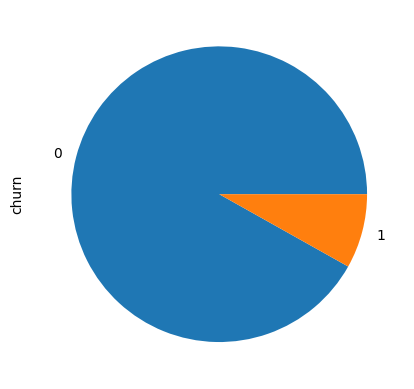

In [21]:
df.churn.value_counts().plot.pie()

#### So, we have tagged the churners, now we need to remove variables related to churn month, i.e _9 

#### We can see the class imbalance in dataset

#### Lets derive some features that could help in modelling

In [22]:
df['arpu_diff'] = df.arpu_8 - ((df.arpu_6 + df.arpu_7)/2)

df['onnet_mou_diff'] = df.onnet_mou_8 - ((df.onnet_mou_6 + df.onnet_mou_7)/2)

df['offnet_mou_diff'] = df.offnet_mou_8 - ((df.offnet_mou_6 + df.offnet_mou_7)/2)

df['roam_ic_mou_diff'] = df.roam_ic_mou_8 - ((df.roam_ic_mou_6 + df.roam_ic_mou_7)/2)

df['roam_og_mou_diff'] = df.roam_og_mou_8 - ((df.roam_og_mou_6 + df.roam_og_mou_7)/2)

df['loc_og_mou_diff'] = df.loc_og_mou_8 - ((df.loc_og_mou_6 + df.loc_og_mou_7)/2)

df['std_og_mou_diff'] = df.std_og_mou_8 - ((df.std_og_mou_6 + df.std_og_mou_7)/2)

df['isd_og_mou_diff'] = df.isd_og_mou_8 - ((df.isd_og_mou_6 + df.isd_og_mou_7)/2)

df['spl_og_mou_diff'] = df.spl_og_mou_8 - ((df.spl_og_mou_6 + df.spl_og_mou_7)/2)

df['total_og_mou_diff'] = df.total_og_mou_8 - ((df.total_og_mou_6 + df.total_og_mou_7)/2)

df['loc_ic_mou_diff'] = df.loc_ic_mou_8 - ((df.loc_ic_mou_6 + df.loc_ic_mou_7)/2)

df['std_ic_mou_diff'] = df.std_ic_mou_8 - ((df.std_ic_mou_6 + df.std_ic_mou_7)/2)

df['isd_ic_mou_diff'] = df.isd_ic_mou_8 - ((df.isd_ic_mou_6 + df.isd_ic_mou_7)/2)

df['spl_ic_mou_diff'] = df.spl_ic_mou_8 - ((df.spl_ic_mou_6 + df.spl_ic_mou_7)/2)

df['total_ic_mou_diff'] = df.total_ic_mou_8 - ((df.total_ic_mou_6 + df.total_ic_mou_7)/2)

df['total_rech_num_diff'] = df.total_rech_num_8 - ((df.total_rech_num_6 + df.total_rech_num_7)/2)

df['total_rech_amt_diff'] = df.total_rech_amt_8 - ((df.total_rech_amt_6 + df.total_rech_amt_7)/2)

df['max_rech_amt_diff'] = df.max_rech_amt_8 - ((df.max_rech_amt_6 + df.max_rech_amt_7)/2)

df['total_rech_data_diff'] = df.total_rech_data_8 - ((df.total_rech_data_6 + df.total_rech_data_7)/2)

df['max_rech_data_diff'] = df.max_rech_data_8 - ((df.max_rech_data_6 + df.max_rech_data_7)/2)

df['av_rech_amt_data_diff'] = df.av_rech_amt_data_8 - ((df.av_rech_amt_data_6 + df.av_rech_amt_data_7)/2)

df['vol_2g_mb_diff'] = df.vol_2g_mb_8 - ((df.vol_2g_mb_6 + df.vol_2g_mb_7)/2)

df['vol_3g_mb_diff'] = df.vol_3g_mb_8 - ((df.vol_3g_mb_6 + df.vol_3g_mb_7)/2)


In [23]:
# delete all variables relating to 9th month
df = df.filter(regex='[^9]$', axis=1)
df.shape

(30001, 173)

In [24]:
# extract all names that end with 9
col_9_names = data_original.filter(regex='9$', axis=1).columns

# update num_cols and cat_cols column name list
cat_cols = [col for col in cat_cols if col not in col_9_names]
cat_cols.append('churn')
num_cols = [col for col in df.columns if col not in cat_cols]

### Lets do some analysis

In [25]:
# change columns types
df[num_cols] = df[num_cols].apply(pd.to_numeric)
df[cat_cols] = df[cat_cols].apply(lambda column: column.astype("category"), axis=0)

In [26]:
def plotter(dataframe, column):
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    sns.boxplot(data=dataframe, x=column, orient='v').set(title=f'Box Plot for {column}')
    plt.subplot(1, 2, 2)
    sns.distplot(dataframe[column].dropna()).set(title=f'Distplot for {column}')
    plt.show()
def plotter_cat(col):
    
    fig,(ax1) = plt.subplots(1,1,figsize=(6,4))
    #plotting for target=1
    sns.countplot(x=col, data=df,ax=ax1,linewidth=1)
    ax1.set_ylabel('Count',fontsize=12)
    ax1.set_title(f'Distribution of {col}',fontsize=14)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=35, ha="right",fontsize=8)
    
    #normalized percentage on top of bars
    for p in ax1.patches:
        if len(ax1.patches)<15:
            ax1.annotate('{:.1f}%'.format((p.get_height()/len(df))*100),
                         (p.get_x()+0.4, p.get_height()+30),
                         ha='center',fontsize=8)
    plt.show()
    
#functions to plot column vs target variable
def num_target_plot(x):
    #sns.boxplot(x=x,y='churn',data=df)
    #plt.show()
    
    
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    sns.boxplot(data=df, x=x,y='churn', orient='h').set(title=f'Box Plot for {x} with churn')
    plt.subplot(1, 2, 2)
    sns.distplot(df[df.churn==1][x]).set(title=f'Distplot for {x} with churn')
    sns.distplot(df[df.churn==0][x]).set(title=f'Distplot for {x} with churn')
    plt.show()
    
def cat_target_plot(x):
    sns.boxplot(x='churn',y=x,data=df)
    plt.show()

#function to cap the outlier
def outlier_capper(x):

    #plotter(df,x)       #before outlier treatment
    q1=df[x].describe()["25%"]
    q3=df[x].describe()["75%"]
    iqr=q3-q1
    lower_bound=q1-1.5*iqr
    upper_bound=q3+1.5*iqr
    df[x]=np.where(df[x]<lower_bound,lower_bound,df[x])
    df[x]=np.where(df[x]>upper_bound,upper_bound,df[x])
    #plotter(df,x)       # after outlier treatment


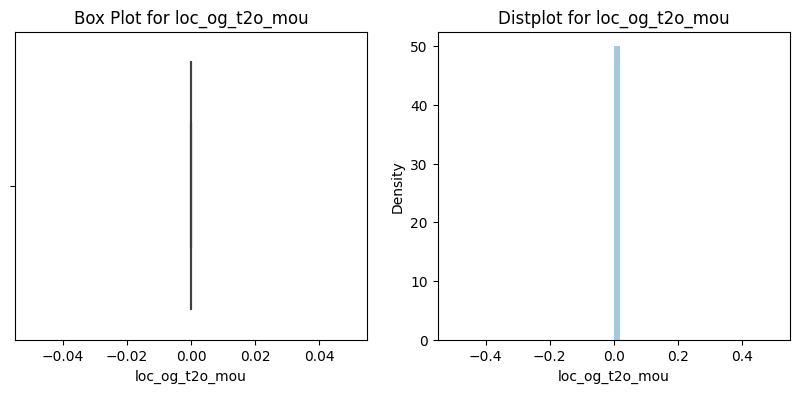

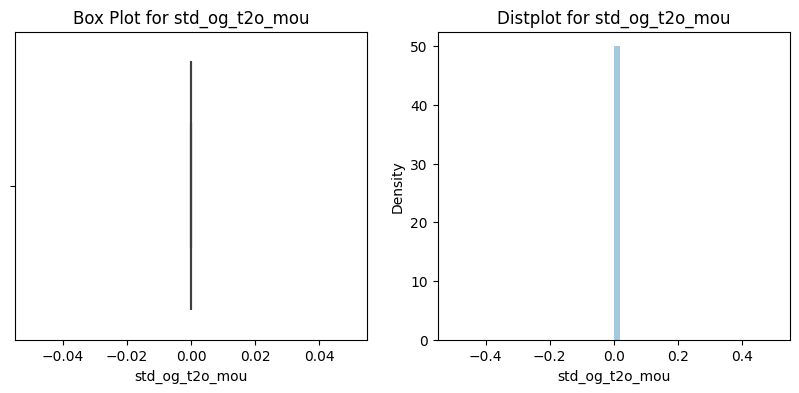

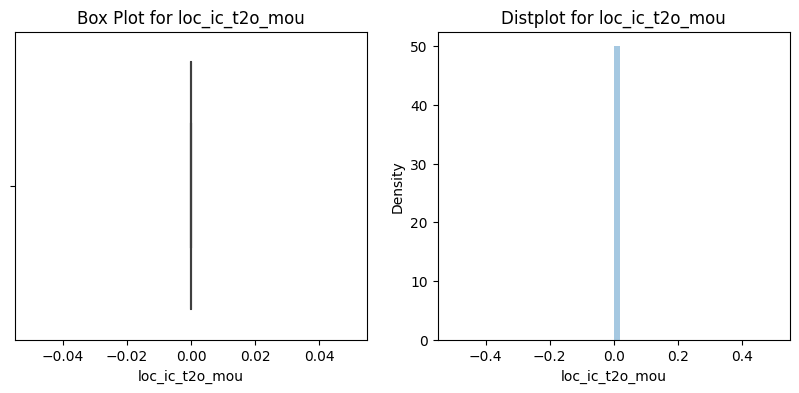

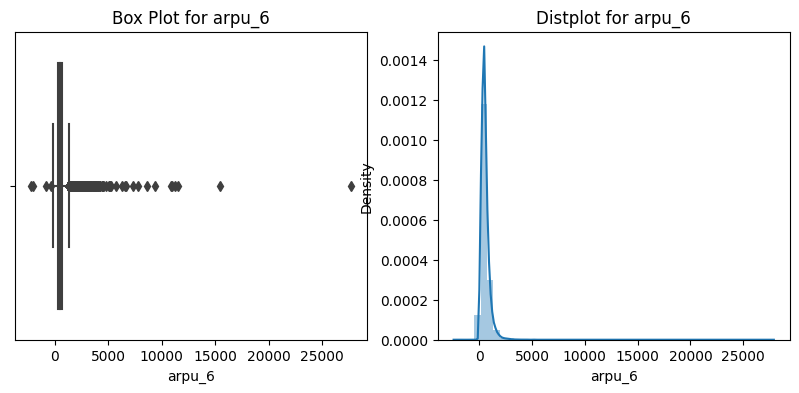

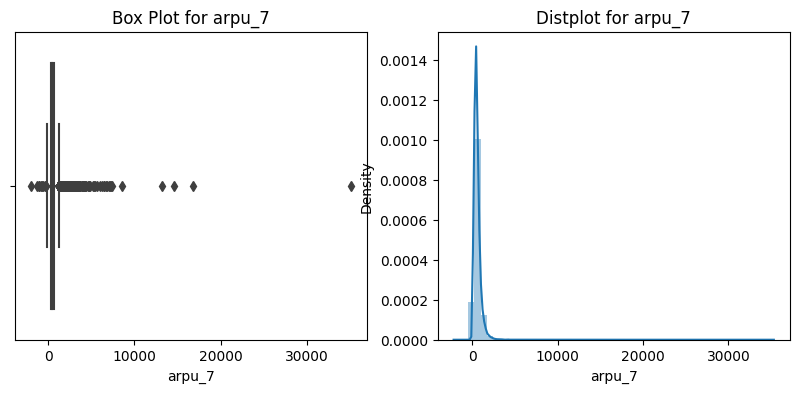

...

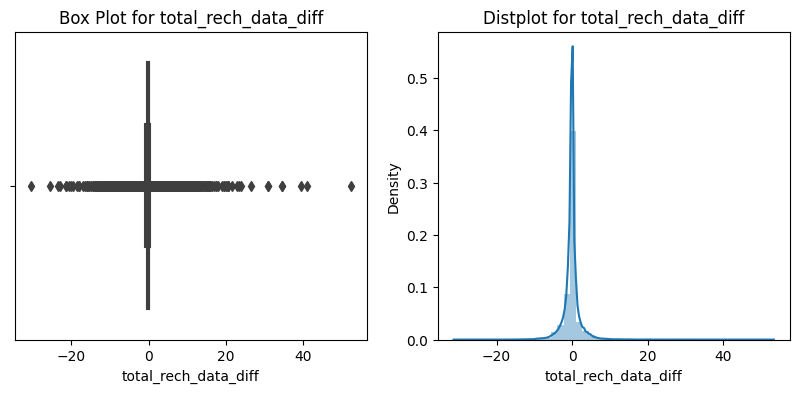

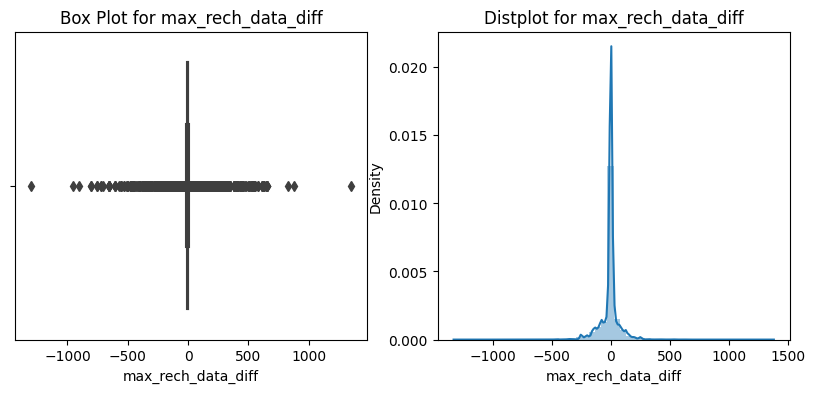

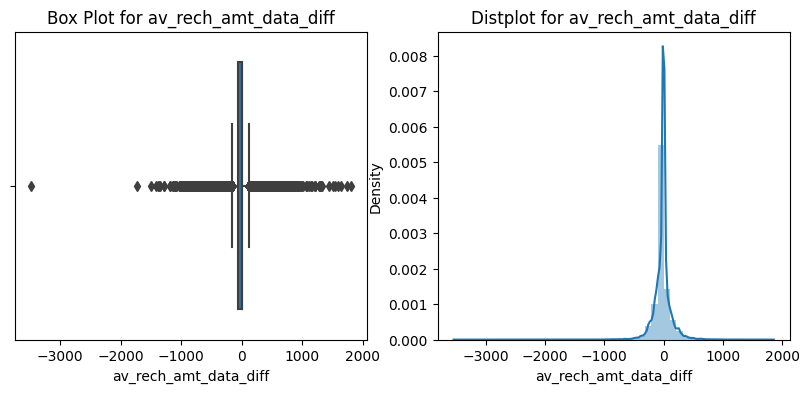

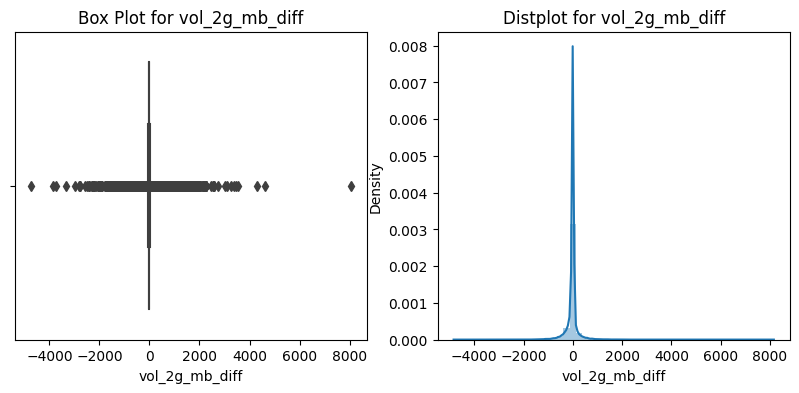

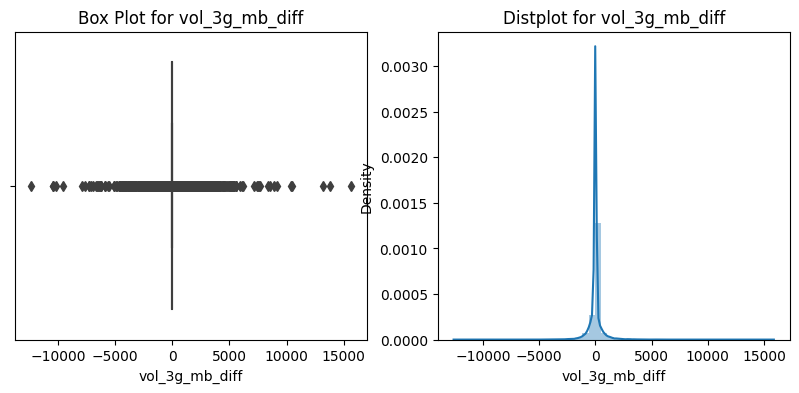

In [27]:
for x in num_cols:
    plotter(df,x)

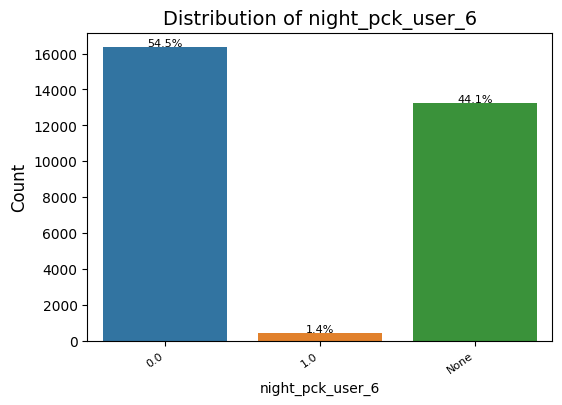

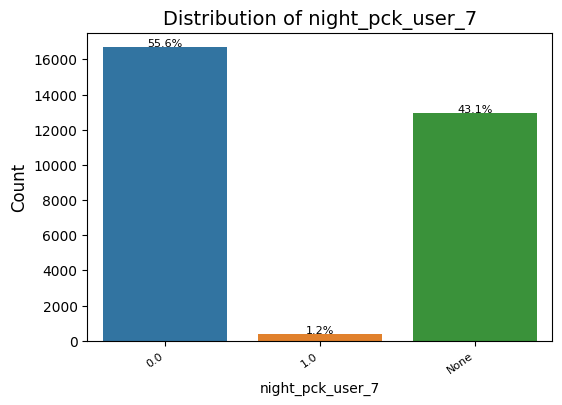

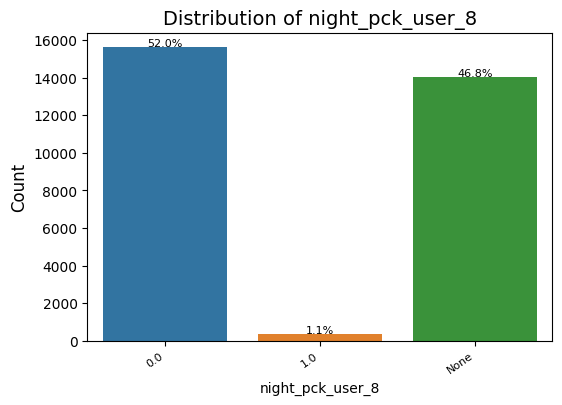

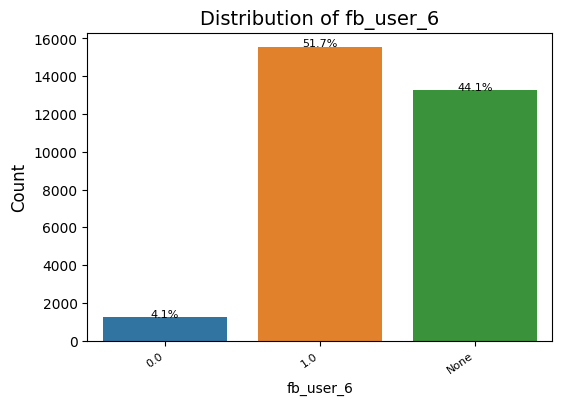

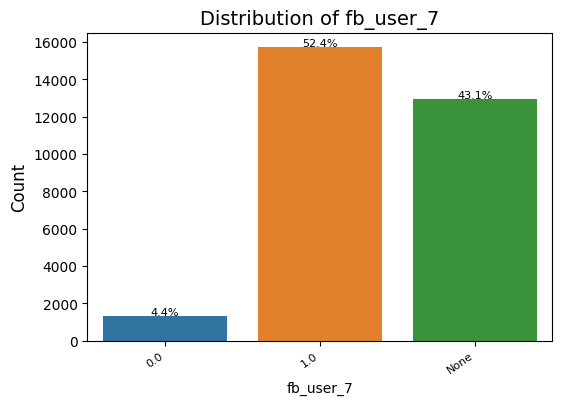

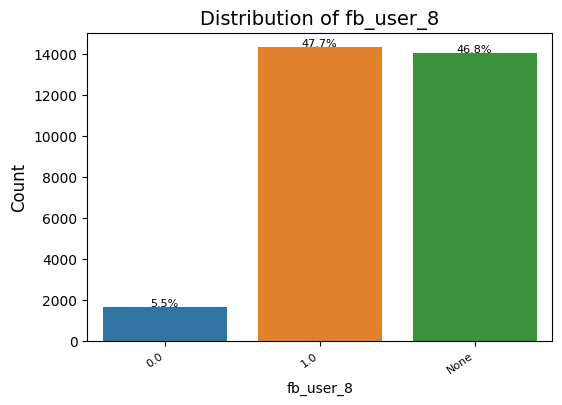

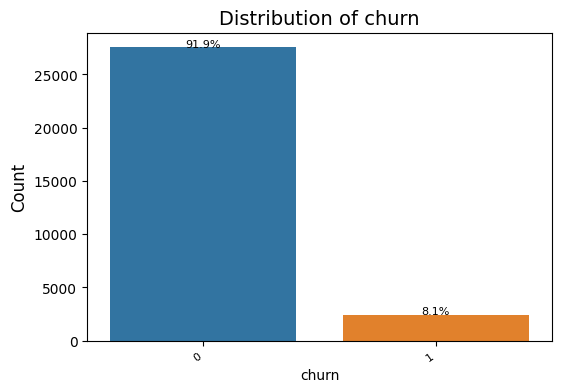

In [28]:
for x in cat_cols:
    plotter_cat(x)

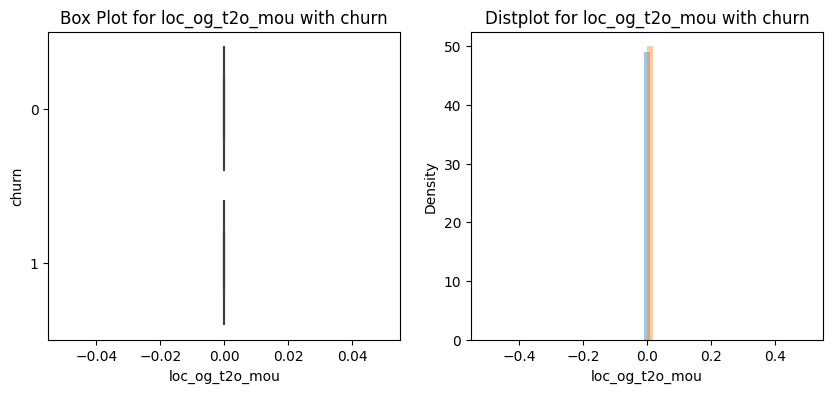

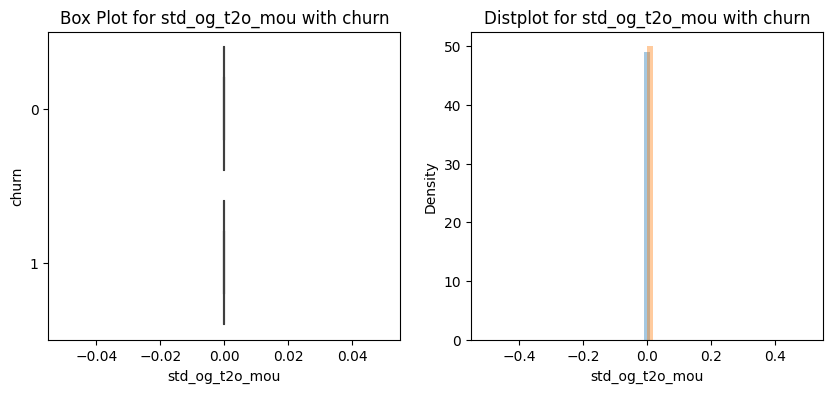

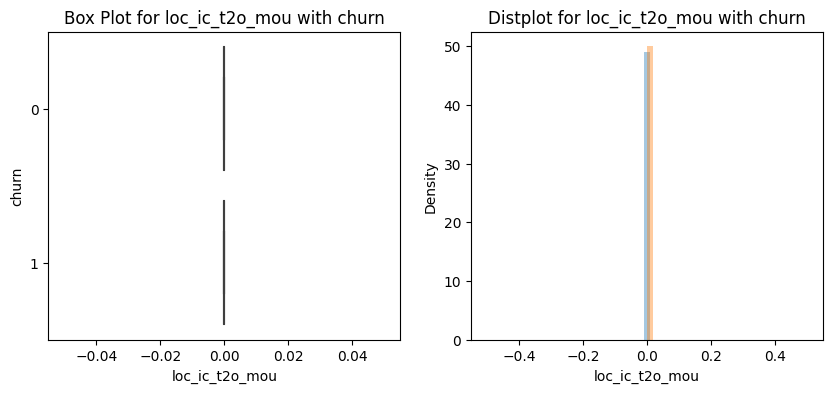

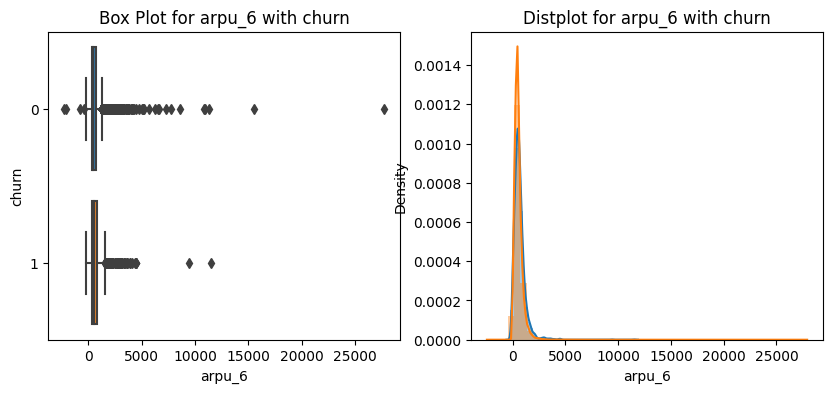

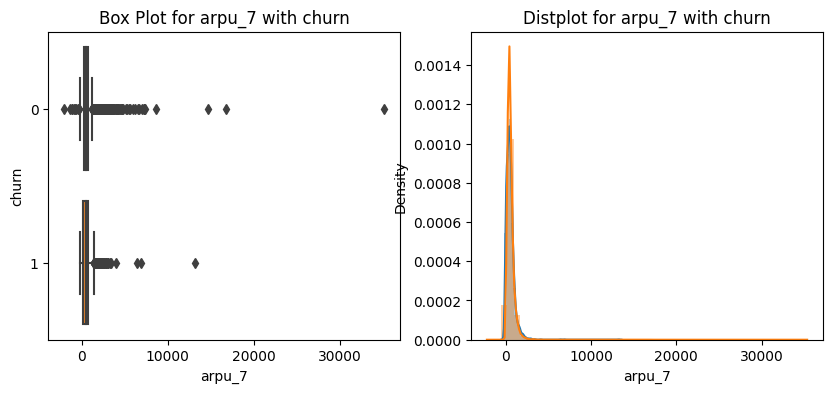

...

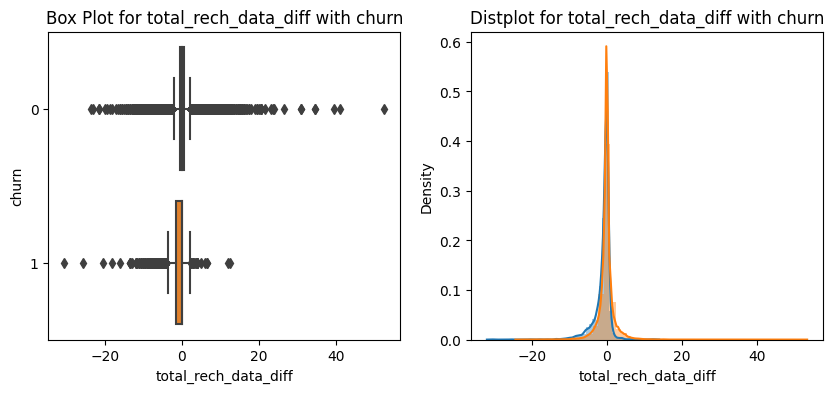

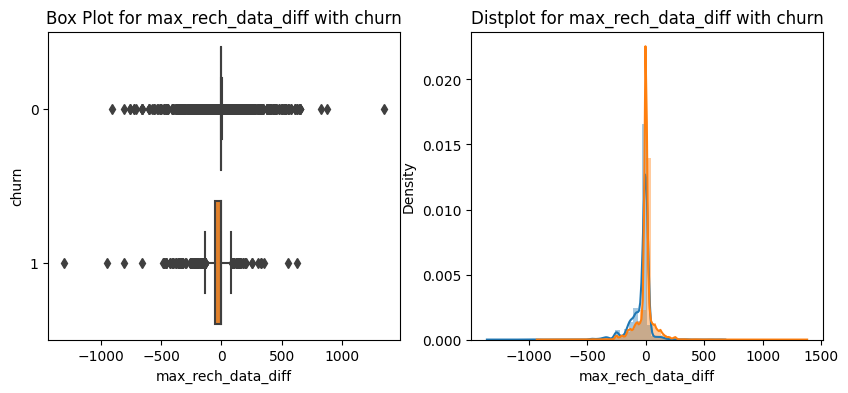

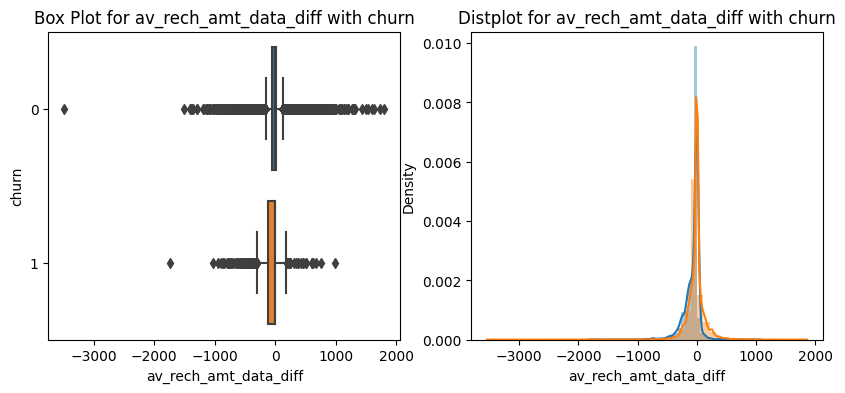

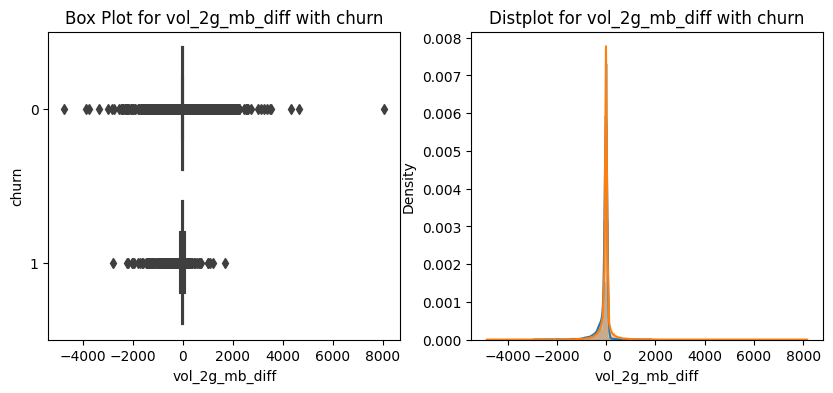

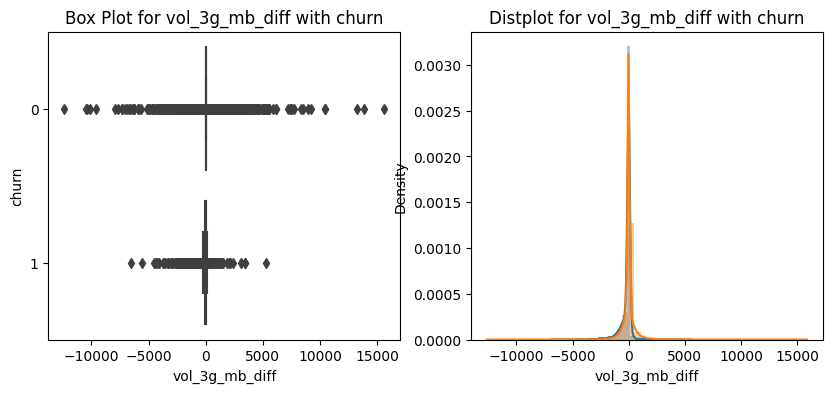

In [29]:
for x in num_cols:
    num_target_plot(x)

#### We see there are several outliers in numerical variables, we need to handle them as well

In [30]:
for x in num_cols:
    outlier_capper(x)

#### Now, we have capped the outliers, we can start with modelling steps

## Stage 2 : Modelling(Churn Prediction)

In [31]:
# import required libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from imblearn.metrics import sensitivity_specificity_support
from sklearn.metrics import roc_auc_score

#### Making dummy variables from categorical variables

In [32]:
cat_cols.remove('churn')

In [33]:
df = pd.get_dummies(data=df, columns=cat_cols,drop_first=True)

#### Now, we have dummy variables for the categorical features, we will scale the numerical variables now.

In [34]:
standard_scaler = StandardScaler()
df[num_cols] = standard_scaler.fit_transform(df[num_cols])

In [35]:
# change target variable churn to numeric
df['churn'] = pd.to_numeric(df['churn'])

In [36]:
# divide data into train and test
X = df.drop("churn", axis = 1)
y = df.churn
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 52, stratify = y)

In [37]:
# print shapes of train and test sets
print(X_train.shape,
        y_train.shape,
        X_test.shape,
        y_test.shape)

(22500, 178) (22500,) (7501, 178) (7501,)


#### Now, selecting important features using PCA

In [38]:
pca = PCA(random_state=52)
pca.fit(X_train)
var_cumu = np.cumsum(pca.explained_variance_ratio_)

In [39]:
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0       17.03
1       30.10
2       37.80
3       43.53
4       48.45
5       52.38
6       55.66
7       58.72
8       60.77
9       62.71
10      64.46
11      66.10
12      67.72
13      69.27
14      70.81
15      72.16
16      73.42
17      74.58
18      75.73
19      76.83
20      77.88
21      78.83
22      79.68
23      80.50
24      81.30
25      82.06
26      82.80
27      83.53
28      84.21
29      84.87
30      85.49
31      86.08
32      86.66
33      87.21
34      87.71
35      88.20
36      88.67
37      89.12
38      89.56
39      89.97
40      90.37
41      90.76
42      91.13
43      91.49
44      91.84
45      92.19
46      92.52
47      92.81
48      93.10
49      93.38
50      93.63
51      93.87
52      94.11
53      94.34
54      94.57
55      94.79
56      95.00
57      95.20
58      95.40
59      95.59
60      95.78
61      95.96
62      96.13
63      96.30
64      96.47
65      96.62
66      96.76
67      96.90
68      97.04
69      97.17
70      97.29
71    

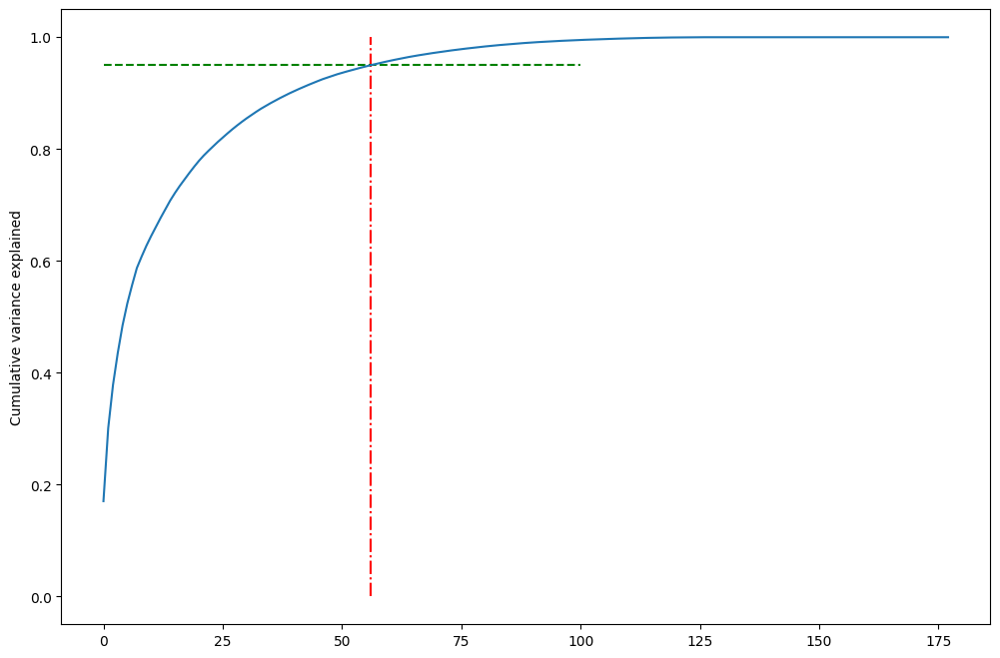

In [40]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=56, ymax=1, ymin=0, colors="r", linestyles="-.")
plt.hlines(y=0.95, xmax=100, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

#### So, we see top 56 principal components explains 95% of variance, hence, we select top 56 PCs

#### We now perform classification with top 56 variables or 95% variance explained

#### Now, we will apply logistic regression on the Principal Components to get the target predictions

In [41]:
pca = PCA(0.95)

In [42]:
df_train_pca = pca.fit_transform(X_train)

In [43]:
df_train_pca.shape

(22500, 58)

In [44]:
learner_pca = LogisticRegression(class_weight={0:0.1, 1: 0.9})

In [45]:
model_pca = learner_pca.fit(df_train_pca, y_train)

In [46]:
pred_probs_train = model_pca.predict_proba(df_train_pca)[:,1]

In [47]:
pred_train = np.where(pred_probs_train<0.5,0,1)

In [48]:
#making a function to calculate all metrices
def eval(y,y_pred,xx):
    confusion = confusion_matrix(y, y_pred)
    print(confusion)
    ## Metrics beyond simply accuracy

    TP = confusion[1,1] # true positive 
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives

    # Let's see the sensitivity of our logistic regression model
    print("Sensitivity : ",end="")
    print(TP / float(TP+FN))

    # Let us calculate specificity
    print("Specificity : ",end="")
    print(TN / float(TN+FP))
    print("roc_auc_score : ",end="")
    print(round(metrics.roc_auc_score(y,xx),2))
    print("accuracy : ",end="")
    print(metrics.accuracy_score(y,y_pred))

def eval_x(y,y_pred):
    confusion = confusion_matrix(y, y_pred)
    print(confusion)
    ## Metrics beyond simply accuracy

    TP = confusion[1,1] # true positive 
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives

    # Let's see the sensitivity of our logistic regression model
    print("Sensitivity : ",end="")
    print(TP / float(TP+FN))

    # Let us calculate specificity
    print("Specificity : ",end="")
    print(TN / float(TN+FP))
    #print("roc_auc_score : ",end="")
    #print(round(metrics.roc_auc_score(y,xx),2))
    print("accuracy : ",end="")
    print(metrics.accuracy_score(y,y_pred))
    acc = metrics.accuracy_score(y,y_pred)

In [49]:
print("Performance on Train Data: ")
eval(y_train, pred_train,xx=pred_probs_train)

Performance on Train Data: 
[[17641  3028]
 [  338  1493]]
Sensitivity : 0.815401419989077
Specificity : 0.8535004112438919
roc_auc_score : 0.9
accuracy : 0.8504


#### Checking this model on test set

In [50]:
df_test_pca = pca.transform(X_test)

In [51]:
df_test_pca.shape

(7501, 58)

In [52]:
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]

In [53]:
pred_test = np.where(pred_probs_test<0.5,0,1)

In [54]:
print("Performance on Test Data: ")
eval(y_test, pred_test,pred_probs_test)

Performance on Test Data: 
[[5898  993]
 [ 156  454]]
Sensitivity : 0.7442622950819672
Specificity : 0.8558989986939486
roc_auc_score : 0.88
accuracy : 0.8468204239434742


### Storing Results to compare

In [55]:
results = pd.DataFrame({'Method':['PCA + Logistic Regression'], 'Train Accuracy': [metrics.accuracy_score(y_train, pred_train)], 'Test Accuracy': [metrics.accuracy_score(y_test, pred_test)]})

In [56]:
results

,Method,Train Accuracy,Test Accuracy
0,PCA + Logistic Regression,0.8504,0.84682


#### Now, we will use the random forest model

In [57]:
# random forest - the class weight is used to handle class imbalance - it adjusts the cost function
forest = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# hyperparameter space
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4]}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=forest, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [58]:
# this step takes 2 min 10 sec on my system...!!!
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


/Users/shusshekhar/miniconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/shusshekhar/miniconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/shusshekhar/miniconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this p

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=RandomForestClassifier(class_weight={0: 0.1, 1: 0.9},
                                              n_jobs=-1),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 0.4]},
             scoring='roc_auc', verbose=1)

In [59]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.9147309947474908
Best hyperparameters:  {'criterion': 'entropy', 'max_features': 0.4}


In [60]:
# predict churn on train data
y_train_pred = model.predict(X_train)
print("Performance on train data:")
eval_x(y_train, y_train_pred)
train_acc = metrics.accuracy_score(y_train, y_train_pred)

Performance on train data:
[[20669     0]
 [    0  1831]]
Sensitivity : 1.0
Specificity : 1.0
accuracy : 1.0


In [61]:
# predict churn on test data
y_pred = model.predict(X_test)
print("Performance on test data:")
eval_x(y_test, y_pred)
test_acc = metrics.accuracy_score(y_test, y_pred)

Performance on test data:
[[6784  107]
 [ 330  280]]
Sensitivity : 0.45901639344262296
Specificity : 0.9844725003627921
accuracy : 0.9417411011865084


In [62]:
results = results.append({'Method':"Random Forest + Grid Search",'Train Accuracy':train_acc,'Test Accuracy':test_acc},ignore_index=True)

In [63]:
results

,Method,Train Accuracy,Test Accuracy
0,PCA + Logistic Regression,0.8504,0.846820
1,Random Forest + Grid Search,1.0000,0.941741


#### Lets try to handle class imbalance using SMOTE and then check accuracies

In [64]:
from imblearn.over_sampling import SMOTE
X_resampled, y_resampled = SMOTE().fit_resample(X_train,y_train)
df_resampled = X_resampled.copy()
df_resampled['churn'] = y_resampled

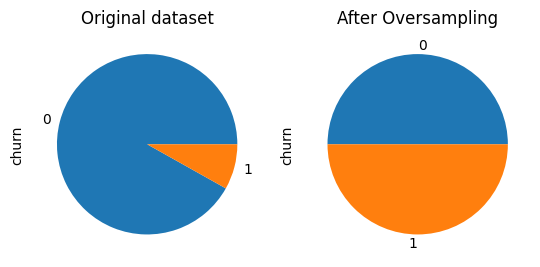

In [65]:
#Lets see the change in churn before and after SMOTE
plt.subplot(1, 2, 1)
plt.title("Original dataset")
df.churn.value_counts().plot.pie()
plt.subplot(1, 2, 2)
# Churn after SMOTE
plt.title("After Oversampling")
df_resampled.churn.value_counts().plot.pie()
plt.show()

#### Now, again selecting important features using PCA

In [66]:
pca = PCA(random_state=52)
pca.fit(X_resampled)
var_cumu = np.cumsum(pca.explained_variance_ratio_)

In [67]:
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0       16.65
1       32.12
2       41.20
3       46.29
4       51.32
5       54.96
6       58.31
7       61.56
8       64.09
9       65.86
10      67.57
11      69.22
12      70.73
13      72.09
14      73.40
15      74.65
16      75.81
17      76.93
18      78.01
19      79.06
20      80.00
21      80.81
22      81.57
23      82.31
24      83.02
25      83.72
26      84.38
27      85.01
28      85.61
29      86.18
30      86.72
31      87.24
32      87.72
33      88.19
34      88.63
35      89.07
36      89.47
37      89.86
38      90.24
39      90.62
40      90.98
41      91.33
42      91.67
43      91.99
44      92.30
45      92.60
46      92.90
47      93.18
48      93.45
49      93.70
50      93.95
51      94.19
52      94.42
53      94.64
54      94.85
55      95.05
56      95.25
57      95.43
58      95.61
59      95.78
60      95.95
61      96.12
62      96.28
63      96.43
64      96.58
65      96.72
66      96.86
67      96.99
68      97.12
69      97.25
70      97.37
71    

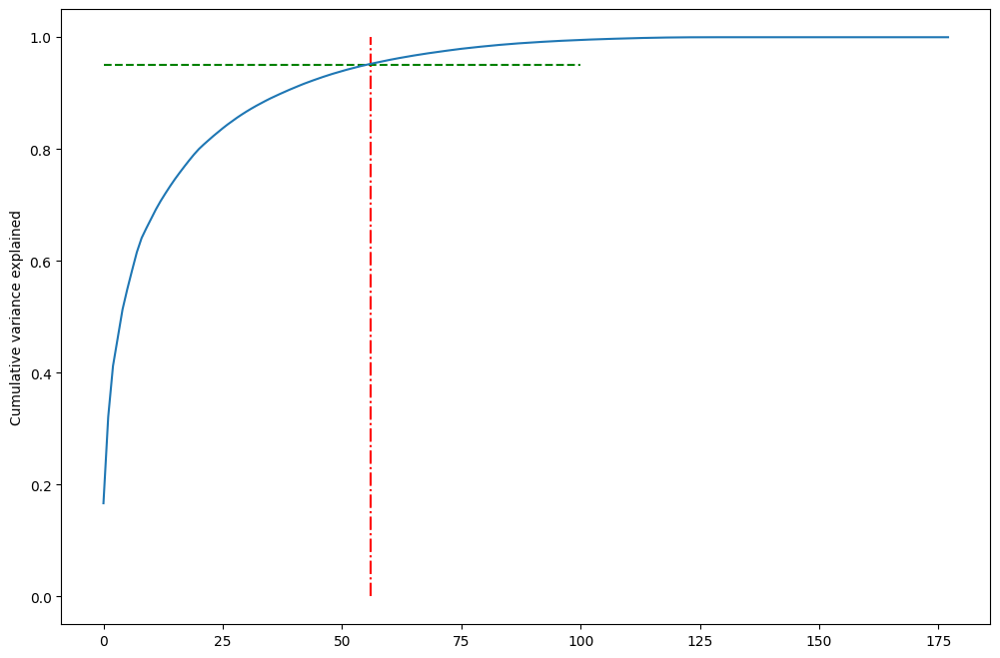

In [68]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=56, ymax=1, ymin=0, colors="r", linestyles="-.")
plt.hlines(y=0.95, xmax=100, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

#### So, we see top 56 principal components explains 95% of variance, hence, we select top 56 PCs

#### We now perform classification with top 56 variables or 95% variance explained

#### Now, we will again apply logistic regression on the Principal Components to get the target predictions

In [69]:
pca = PCA(0.95)

In [70]:
df_train_pca = pca.fit_transform(X_resampled)

In [71]:
df_train_pca.shape

(41338, 56)

In [72]:
learner_pca = LogisticRegression(class_weight={0:0.1, 1: 0.9})

In [73]:
model_pca = learner_pca.fit(df_train_pca, y_resampled)

In [74]:
pred_probs_train = model_pca.predict_proba(df_train_pca)[:,1]

In [75]:
pred_train = np.where(pred_probs_train<0.5,0,1)

In [76]:
print("Performance on Train Data: ")
eval(y_resampled, pred_train,xx=pred_probs_train)
train_acc = metrics.accuracy_score(y_resampled, pred_train)

Performance on Train Data: 
[[ 9634 11035]
 [  323 20346]]
Sensitivity : 0.9843727321108907
Specificity : 0.4661086651507088
roc_auc_score : 0.91
accuracy : 0.7252406986307998


#### Checking this model on test set

In [77]:
df_test_pca = pca.transform(X_test)

In [78]:
df_test_pca.shape

(7501, 56)

In [79]:
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]

In [80]:
pred_test = np.where(pred_probs_test<0.5,0,1)

In [81]:
print("Performance on Test Data: ")
eval(y_test, pred_test,pred_probs_test)
test_acc = metrics.accuracy_score(y_test, pred_test)

Performance on Test Data: 
[[3309 3582]
 [  34  576]]
Sensitivity : 0.9442622950819672
Specificity : 0.4801915542011319
roc_auc_score : 0.87
accuracy : 0.5179309425409946


### Adding in results dataframe

In [82]:
results = results.append({'Method':"SMOTE + PCA + Logistic Regression",'Train Accuracy':train_acc,'Test Accuracy':test_acc},ignore_index=True)

In [83]:
results

,Method,Train Accuracy,Test Accuracy
0,PCA + Logistic Regression,0.850400,0.846820
1,Random Forest + Grid Search,1.000000,0.941741
2,SMOTE + PCA + Logistic Regression,0.725241,0.517931


#### Now, we will use the random forest model

In [84]:
# random forest - the class weight is used to handle class imbalance - it adjusts the cost function
forest = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# hyperparameter space
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4]}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=forest, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [85]:
# this step takes 1 min 50 sec on my system...!!!
# fit model
model.fit(X_resampled, y_resampled)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


/Users/shusshekhar/miniconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/shusshekhar/miniconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/shusshekhar/miniconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this p

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=RandomForestClassifier(class_weight={0: 0.1, 1: 0.9},
                                              n_jobs=-1),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 0.4]},
             scoring='roc_auc', verbose=1)

In [86]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.9944979564634246
Best hyperparameters:  {'criterion': 'entropy', 'max_features': 'auto'}


In [87]:
# predict churn on train data
y_train_pred = model.predict(X_resampled)
print("Performance on train data:")
eval_x(y_resampled, y_train_pred)
train_acc = metrics.accuracy_score(y_resampled, y_train_pred)

Performance on train data:
[[20669     0]
 [    0 20669]]
Sensitivity : 1.0
Specificity : 1.0
accuracy : 1.0


In [88]:
# predict churn on test data
y_pred = model.predict(X_test)
print("Performance on test data:")
eval_x(y_test, y_pred)
test_acc = metrics.accuracy_score(y_test, y_pred)

Performance on test data:
[[6664  227]
 [ 263  347]]
Sensitivity : 0.5688524590163935
Specificity : 0.9670584820780729
accuracy : 0.9346753766164512


In [89]:
results = results.append({'Method':"SMOTE + Random Forest + Grid Search",'Train Accuracy':train_acc,'Test Accuracy':test_acc},ignore_index=True)

In [90]:
results

,Method,Train Accuracy,Test Accuracy
0,PCA + Logistic Regression,0.850400,0.846820
1,Random Forest + Grid Search,1.000000,0.941741
2,SMOTE + PCA + Logistic Regression,0.725241,0.517931
3,SMOTE + Random Forest + Grid Search,1.000000,0.934675


#### We have a better TEST accuracy using random forest without SMOTE.

### So, we have a Random forest model with test accuracy of 93%. 

## Stage 3 : Identifying important churn indicators

In [91]:
# run a random forest model on train data
max_features = int(round(np.sqrt(X_train.shape[1])))    # number of variables to consider to split each node
print(max_features)

rf_model = RandomForestClassifier(n_estimators=100, max_features=max_features, class_weight={0:0.1, 1: 0.9}, oob_score=True, random_state=4, verbose=1)


13


In [92]:
# fit model
rf_model.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    6.8s finished


RandomForestClassifier(class_weight={0: 0.1, 1: 0.9}, max_features=13,
                       oob_score=True, random_state=4, verbose=1)

In [93]:
# OOB score
print(rf_model.oob_score_)

len(X_train.columns)


0.9433777777777778


178

In [94]:
# predict churn on test data
y_pred = rf_model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = rf_model.predict_proba(X_test)[:, 1]
print("ROC:    \t", round(roc_auc_score(y_test, y_pred_prob),3))

[[6805   86]
 [ 348  262]]
Sensitivity: 	0.43
Specificity: 	0.99
ROC:    	 0.9


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


#### Important features

In [95]:
# predictors
features = df.drop('churn', axis=1).columns

# feature_importance
importance = rf_model.feature_importances_

# create dataframe
feature_importance = pd.DataFrame({'variables': features, 'importance_percentage': importance*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance

Sum of importance= 99.99999999999999


,variables,importance_percentage
0,total_ic_mou_8,6.380993
1,last_day_rch_amt_8,4.110307
2,total_og_mou_8,3.776611
3,arpu_diff,3.120629
4,total_rech_amt_8,2.834186
5,loc_ic_mou_8,2.829560
6,arpu_8,2.809232
7,total_rech_amt_diff,2.789673
8,loc_og_t2m_mou_8,2.632112
9,loc_ic_t2m_mou_8,2.392059


#### Extracting top 35 variables

In [96]:
# extract top 'n' features
top_n = 35
top_features = feature_importance.variables[0:top_n]

<AxesSubplot:>

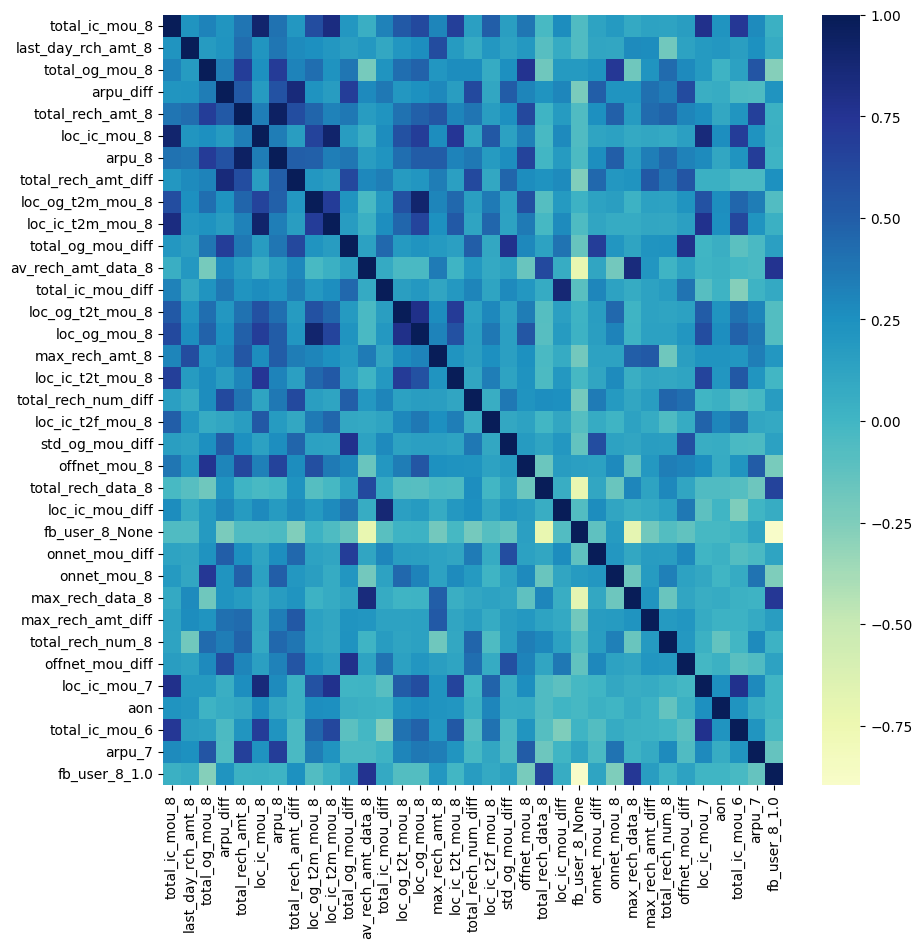

In [97]:
# plot feature correlation
import seaborn as sns
plt.rcParams["figure.figsize"] =(10,10)
mycmap = sns.diverging_palette(199, 359, s=99, center="light", as_cmap=True)
sns.heatmap(data=X_train[top_features].corr(), center=0.0, cmap='YlGnBu')

#### These are top 35 variables

In [98]:
df[top_features].apply(lambda x: x.corr(df.churn)).sort_values(ascending=False)

fb_user_8_None         0.204996
arpu_7                -0.030342
total_ic_mou_6        -0.066617
aon                   -0.108281
onnet_mou_8           -0.109755
loc_ic_mou_7          -0.128119
loc_ic_mou_diff       -0.134762
offnet_mou_8          -0.141018
max_rech_data_8       -0.155137
loc_ic_t2f_mou_8      -0.159518
total_rech_data_8     -0.162807
loc_og_t2t_mou_8      -0.168553
loc_ic_t2t_mou_8      -0.170636
av_rech_amt_data_8    -0.171290
total_og_mou_8        -0.176681
loc_og_t2m_mou_8      -0.180650
onnet_mou_diff        -0.180749
last_day_rch_amt_8    -0.181614
loc_og_mou_8          -0.182934
total_rech_num_8      -0.184380
loc_ic_t2m_mou_8      -0.190790
loc_ic_mou_8          -0.194021
fb_user_8_1.0         -0.199321
offnet_mou_diff       -0.199515
max_rech_amt_8        -0.207677
std_og_mou_diff       -0.213803
total_ic_mou_diff     -0.217733
max_rech_amt_diff     -0.225499
arpu_8                -0.228630
total_rech_amt_8      -0.230080
total_ic_mou_8        -0.233602
total_re

## Stage 4 - Recommendations:
   - Customers who decrease internet usage in previous months are likely to churn.
       - Allow some internet usage plans to get customers back to use internet services.
   - Customers with less usage minutes are likely to churn.
       - Some discounts can be provided when talk minutes recuce significantly.
   - Reduced ARPU are also indicators of increased churn possibility.
       - Discounted rates can be offered to increase ARPU.